# Библиотеки

In [1]:
from ultralytics import YOLO
from PIL import Image
from patched_yolo_infer import (
    MakeCropsDetectThem,
    CombineDetections,
    visualize_results_usual_yolo_inference,
    visualize_results,
)

import cv2
import matplotlib.pyplot as plt

from Module.showInferensModel import load_labels, plot_image_with_boxes

# Константы

In [2]:
PATH_BEST = '../Weightts/120.pt'
PATH_TEST_IMAGES = './DataSet/MyData/Test/images'
PATH_TEST_LABELS = './DataSet/MyData/Test/labels'
SAVE_RESULT = './Result/'
NAME = '1'

In [3]:
model = YOLO(PATH_BEST)

# На фотографии

In [4]:
NAME = '130'
results = model(f'{PATH_TEST_IMAGES}/{NAME}.jpg')  # Замените на путь к вашему изображению

# # Визуализация и сохранение результата
# for result in results:
#     result.show()  # Отобразить изображение с детекцией
#     result.save(SAVE_RESULT)  # Сохранить результат


image 1/1 d:\Nsu\SearchPersonAI\AI\DataSet\MyData\Test\images\130.jpg: 480x640 (no detections), 59.0ms
Speed: 4.0ms preprocess, 59.0ms inference, 23.0ms postprocess per image at shape (1, 3, 480, 640)


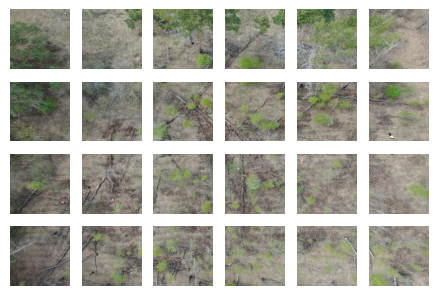

Number of generated images: 24


In [5]:
img = cv2.imread(f'{PATH_TEST_IMAGES}/{NAME}.jpg')

element_crops = MakeCropsDetectThem(
    image=img,
    model_path=PATH_BEST,
    segment=False,
    show_crops=True,
    shape_x=640,
    shape_y=640,
    overlap_x=5,
    overlap_y=5,
    conf=0.5,
    iou=0.7,
    classes_list=[0],
)
result = CombineDetections(element_crops, nms_threshold=0.1)

Basic yolo inference:


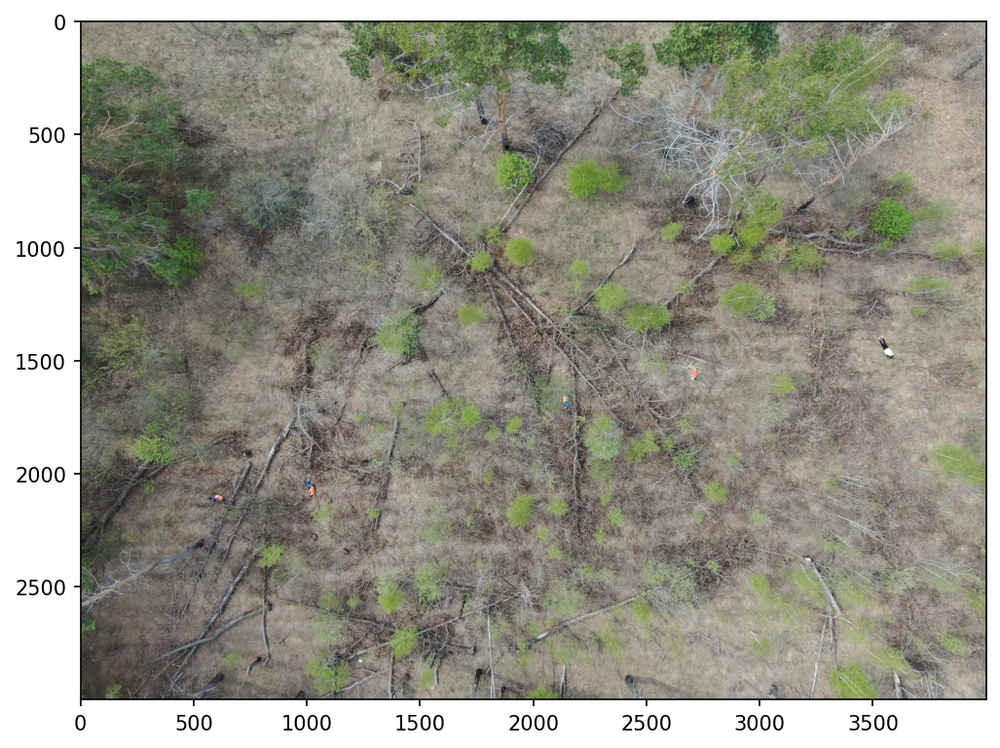

YOLO-Patch-Based-Inference:


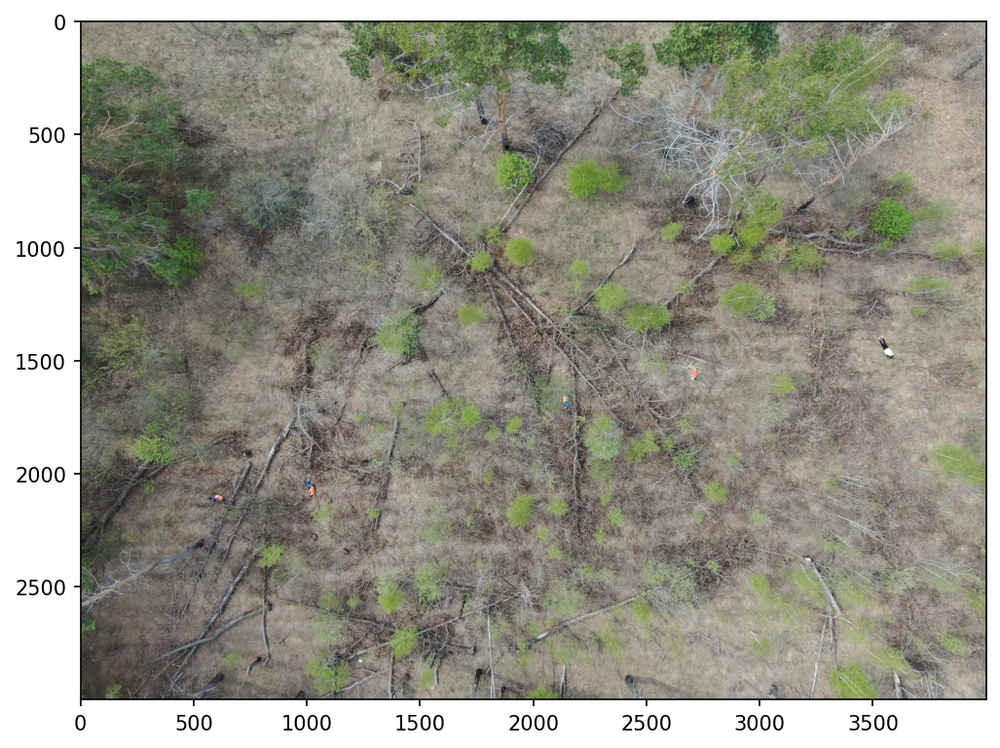

In [6]:
print('Basic yolo inference:')
visualize_results_usual_yolo_inference(
    img,
    model=model,
    imgsz=640,
    conf=0.5,
    iou=0.7,
    thickness=8,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

print('YOLO-Patch-Based-Inference:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    thickness=8,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

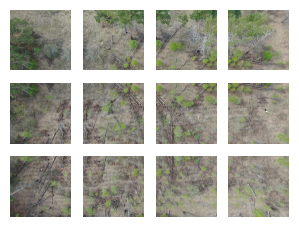

Number of generated images: 12
Before nms:


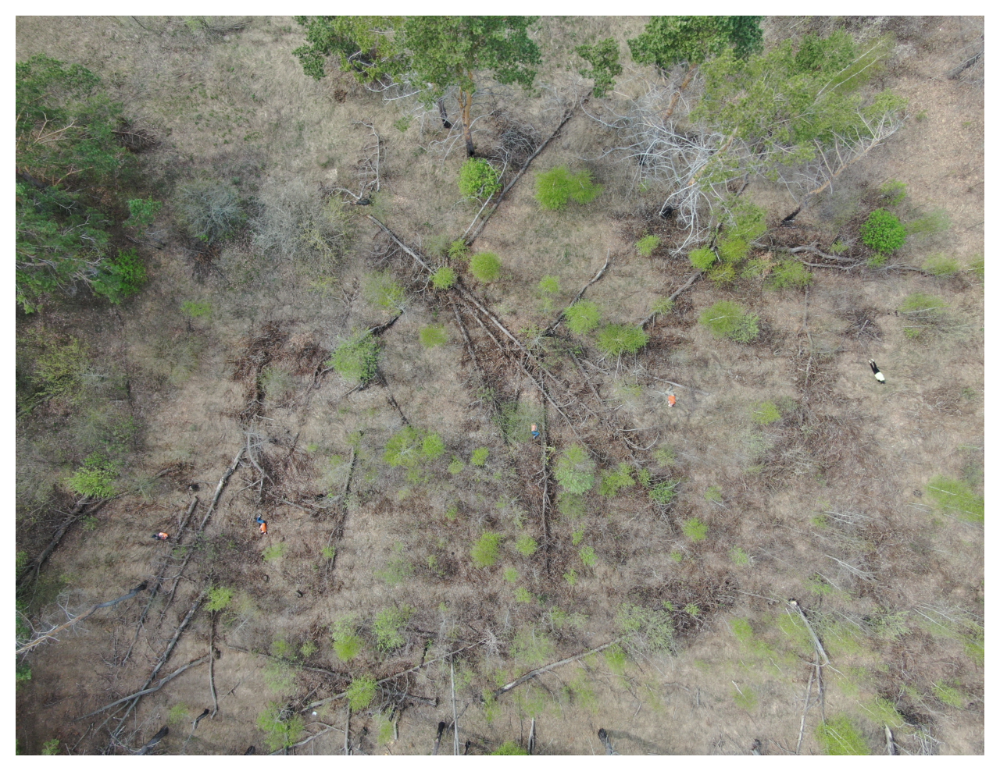

After nms:


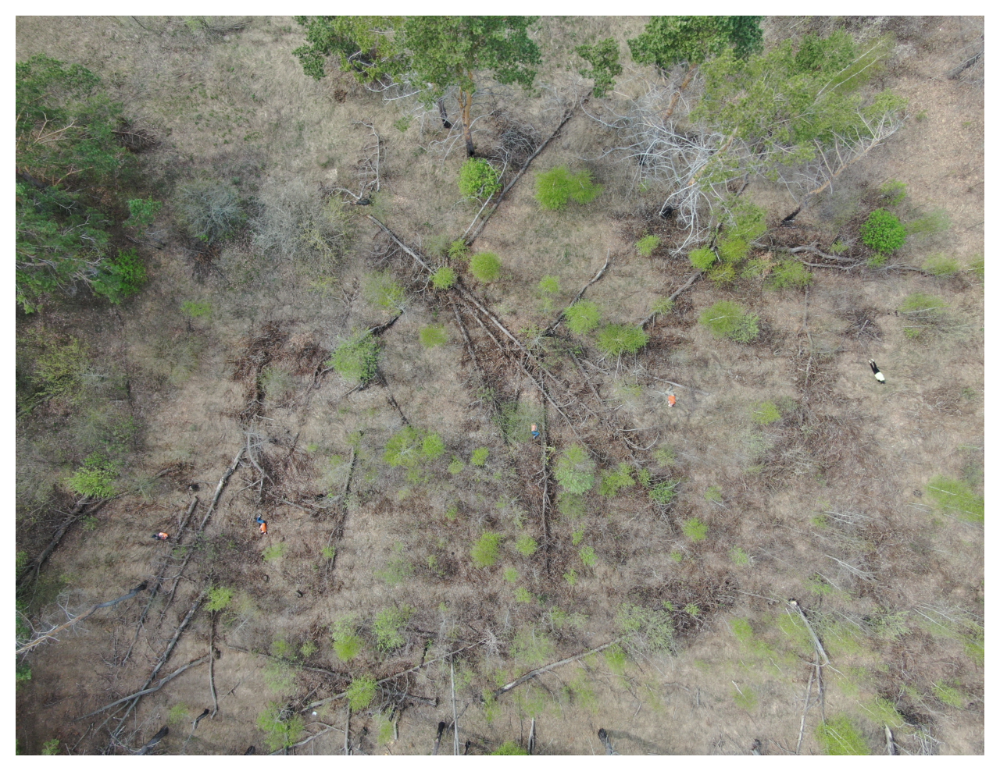

In [7]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path=PATH_BEST,
    segment=False,
    show_crops=True,
    shape_x=1000,
    shape_y=1000,
    overlap_x=20,
    overlap_y=20,
    conf=0.5,
    iou=0.5,
    classes_list=[0],
    resize_initial_size=False,
)
result = CombineDetections(element_crops, nms_threshold=0.1)

print('Before nms:')
visualize_results(
    img=result.image,
    confidences=result.detected_conf_list_full,
    boxes=result.detected_xyxy_list_full,
    classes_ids=result.detected_cls_id_list_full,
    classes_names=result.detected_cls_names_list_full,
    thickness=8,
    font_scale=1.2,
    show_boxes=True,
    delta_colors=3,
    dpi=200,
)

print('After nms:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    thickness=8,
    font_scale=1.2,
    show_boxes=True,
    delta_colors=3,
    dpi=200,
)

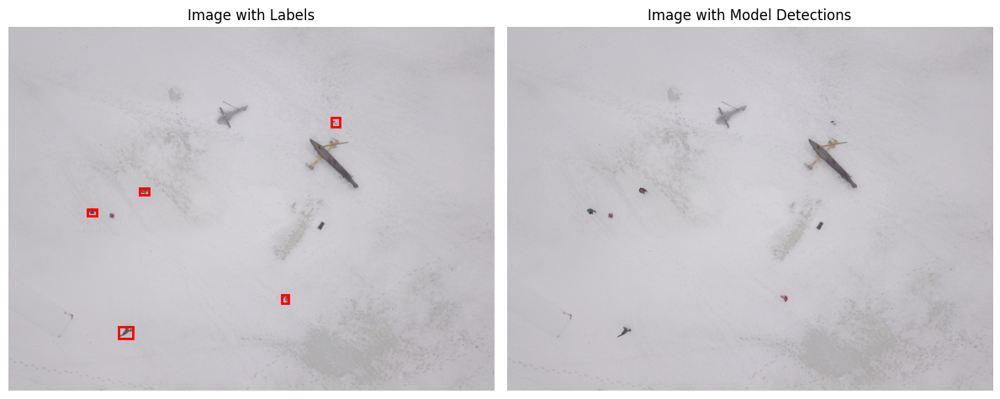

In [8]:

results = model(f'{PATH_TEST_IMAGES}/{NAME}.jpg')  # Замените на путь к вашему изображению
img = Image.open(f'{PATH_TEST_IMAGES}/{NAME}.jpg')
labels = load_labels(f'{PATH_TEST_LABELS}/{NAME}.txt')

# Создаем подграфики для отображения
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Отображаем исходное изображение с метками
plot_image_with_boxes(img, labels, axes[0], 'Image with Labels')

# Отображаем изображение с результатами модели
boxes_model = results[0].boxes.xyxy  # Доступ к результатам первого изображения
for box in boxes_model:
    x1, y1, x2, y2 = box.tolist()
    axes[1].add_patch(plt.Rectangle(
        (x1, y1), x2 - x1, y2 - y1,
        fill=False, edgecolor='blue', linewidth=2
    ))

axes[1].imshow(img)
axes[1].set_title('Image with Model Detections')

# Убираем оси и показываем изображения
for ax in axes:
    ax.axis('off')

plt.tight_layout()  # Чтобы картинки не накладывались друг на друга
plt.show()